<a href="https://colab.research.google.com/github/visheshagrawal/Course-DeepLearning/blob/main/DL_Assignment_4_Q1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -U nltk

Requirement already up-to-date: nltk in /usr/local/lib/python3.7/dist-packages (3.6.2)


In [ ]:
import numpy as np
import cv2
from datetime import datetime 
from torch.nn.utils.rnn import pack_padded_sequence
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset,DataLoader
from torchvision.models import vgg19_bn
from torch.utils.data import Dataset, DataLoader
from skimage import io, transform
from torch import optim
from torchtext.data.metrics import bleu_score
from torchvision import datasets, transforms
import os
from collections import Counter
import random
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from tqdm import tqdm
from nltk.translate.bleu_score import corpus_bleu
from nltk.translate.meteor_score import meteor_score
from torchsummary import summary
import pickle
!matplotlib inline
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

/bin/bash: matplotlib: command not found


In [ ]:
DEVICE

'cuda'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# train_file = open('/content/drive/My Drive/DL_Assignment_3_4/Assignment_3/Question_1/Data/Train/train_captions.pkl', 'rb')
# data = pickle.load(file)
# file.close()   content/drive/My Drive/Assignment_4/Question_1/Data/Train/Images/3393035454_2d2370ffd4.jpg
import pandas as pd
import glob

train_images = os.listdir('/content/drive/My Drive/Assignment_4/Question_1/Data/Train/Images')
train_captions = pickle.load(open('/content/drive/My Drive/Assignment_4/Question_1/Data/Train/train_captions.pkl', 'rb'))
test_images = os.listdir('/content/drive/My Drive/Assignment_4/Question_1/Data/Test/Images')
test_captions = pickle.load(open('/content/drive/My Drive/Assignment_4/Question_1/Data/Test/test_captions.pkl', 'rb'))
val_images = os.listdir('/content/drive/My Drive/Assignment_4/Question_1/Data/Val/Images')
val_captions = pickle.load(open('/content/drive/My Drive/Assignment_4/Question_1/Data/Val/val_captions.pkl', 'rb'))

print(train_images)
print(train_captions)

['405051459_3b3a3ba5b3.jpg', '2561849813_ff9caa52ac.jpg', '2324979199_4193ef7537.jpg', '2832033116_1677ea1e2e.jpg', '3337046794_296bd2c7e0.jpg', '514222303_cb98584536.jpg', '3310551665_15b79ef4ea.jpg', '108899015_bf36131a57.jpg', '2947172114_b591f84163.jpg', '2894229082_ddc395f138.jpg', '3582689770_e57ab56671.jpg', '3053916979_848d32261b.jpg', '2831215155_07ba8f1805.jpg', '2496236371_61dec88113.jpg', '469969326_4b84073286.jpg', '1253264731_e7c689eca5.jpg', '554526471_a31f8b74ef.jpg', '578644583_da3ff18dd1.jpg', '3268407162_6274e0f74f.jpg', '2867699650_e6ddb540de.jpg', '2492258999_5764124bba.jpg', '506478284_7cf8bdbe36.jpg', '2490179961_e842fda5eb.jpg', '2460799229_ce45a1d940.jpg', '2882589788_cb0b407a8d.jpg', '3086526292_f799d237c7.jpg', '1969573381_5ecfae4c80.jpg', '241345533_99c731403a.jpg', '2968216482_ede65b20a8.jpg', '2585141045_b496a7b7c4.jpg', '2194495372_bdac7d9e71.jpg', '3356901257_83811a19eb.jpg', '365584746_681f33fa46.jpg', '2178306830_6af49375b4.jpg', '561179890_af8e31cb2e.

In [ ]:
print(train_images)
print(train_captions)
train_paths = []
train_caps = []
val_paths = []
val_caps = []
test_paths = []
test_caps = []
min_word_freq=2
max_cap_len=80
caps_per_img=5
word_freq = Counter()
data = None

for image in train_captions:
  cap = []
  path = None
  for sentence in train_captions[image]:
      if max_cap_len >= len(sentence.split(" ")):
          cap.append(sentence.split(" "))
      word_freq.update(sentence.split(" "))
  path = os.path.join("/content/drive/My Drive/Assignment_4/Question_1/Data/Train/Images", image)
  train_paths.append(path)
  train_caps.append(cap)

for image in val_captions:
  cap = []
  path = None
  for sentence in val_captions[image]:
      if max_cap_len >= len(sentence.split(" ")):
          cap.append(sentence.split(" "))
      word_freq.update(sentence.split(" "))
  path = os.path.join("/content/drive/My Drive/Assignment_4/Question_1/Data/Val/Images", image)
  val_paths.append(path)
  val_caps.append(cap)

for image in test_captions:
  cap = []
  path = None
  for sentence in test_captions[image]:
      if max_cap_len >= len(sentence.split(" ")):
          cap.append(sentence.split(" "))
      word_freq.update(sentence.split(" "))
  path = os.path.join("/content/drive/My Drive/Assignment_4/Question_1/Data/Test/Images", image)
  test_paths.append(path)
  test_caps.append(cap)

print(train_paths)

['405051459_3b3a3ba5b3.jpg', '2561849813_ff9caa52ac.jpg', '2324979199_4193ef7537.jpg', '2832033116_1677ea1e2e.jpg', '3337046794_296bd2c7e0.jpg', '514222303_cb98584536.jpg', '3310551665_15b79ef4ea.jpg', '108899015_bf36131a57.jpg', '2947172114_b591f84163.jpg', '2894229082_ddc395f138.jpg', '3582689770_e57ab56671.jpg', '3053916979_848d32261b.jpg', '2831215155_07ba8f1805.jpg', '2496236371_61dec88113.jpg', '469969326_4b84073286.jpg', '1253264731_e7c689eca5.jpg', '554526471_a31f8b74ef.jpg', '578644583_da3ff18dd1.jpg', '3268407162_6274e0f74f.jpg', '2867699650_e6ddb540de.jpg', '2492258999_5764124bba.jpg', '506478284_7cf8bdbe36.jpg', '2490179961_e842fda5eb.jpg', '2460799229_ce45a1d940.jpg', '2882589788_cb0b407a8d.jpg', '3086526292_f799d237c7.jpg', '1969573381_5ecfae4c80.jpg', '241345533_99c731403a.jpg', '2968216482_ede65b20a8.jpg', '2585141045_b496a7b7c4.jpg', '2194495372_bdac7d9e71.jpg', '3356901257_83811a19eb.jpg', '365584746_681f33fa46.jpg', '2178306830_6af49375b4.jpg', '561179890_af8e31cb2e.

In [ ]:
word_map = {'<pad>': 0}
idx = 1
for key in word_freq.keys():
    if word_freq[key] > min_word_freq:
        word_map[key] = idx
        idx += 1
word_map['<unk>'] = idx
idx += 1
word_map['<start>'] = idx
idx += 1
word_map['<end>'] = idx

In [ ]:
print(word_map)

{'<pad>': 0, 'A': 1, 'black': 2, 'dog': 3, 'is': 4, 'running': 5, 'after': 6, 'a': 7, 'white': 8, 'in': 9, 'the': 10, 'snow': 11, '.': 12, 'Black': 13, 'chasing': 14, 'brown': 15, 'through': 16, 'Two': 17, 'dogs': 18, 'chase': 19, 'each': 20, 'other': 21, 'across': 22, 'snowy': 23, 'ground': 24, 'play': 25, 'together': 26, 'low': 27, 'lying': 28, 'body': 29, 'of': 30, 'water': 31, 'little': 32, 'baby': 33, 'plays': 34, 'croquet': 35, 'girl': 36, 'next': 37, 'to': 38, 'truck': 39, 'The': 40, 'child': 41, 'playing': 42, 'by': 43, 'kid': 44, 'front': 45, 'car': 46, 'with': 47, 'put': 48, 'and': 49, 'ball': 50, 'boy': 51, 'hammer': 52, 'beside': 53, 'has': 54, 'something': 55, 'hot': 56, 'pink': 57, 'its': 58, 'mouth': 59, 'holding': 60, 'hat': 61, 'shirt': 62, 'carrying': 63, 'while': 64, 'walking': 65, 'looking': 66, 'forward': 67, 'along': 68, 'beach': 69, 'wearing': 70, 'collar': 71, 'walks': 72, 'on': 73, 'sand': 74, 'near': 75, 'Brown': 76, 'large': 77, 'ocean': 78, 'red': 79, 'Frisb

In [ ]:
VOCAB_LEN = max(word_map.values())+1
VOCAB_LEN

4230

In [ ]:
def index_caps_images(split_paths, split_caps, caps_per_img=caps_per_img, word_map=word_map):
    captions_indexed = []
    cap_len = []
    images_dict = {}
    breaker = 0
    for idx, path in enumerate(tqdm(split_paths)):
        if breaker>100:
            break
        if len(split_caps[idx]) < caps_per_img:
            captions = split_caps[idx] + random.choice(split_caps[idx], caps_per_img - len(split_caps[idx]))
        else:
            captions = random.sample(split_caps[idx], k=caps_per_img)
        img = cv2.imread(split_paths[idx])
        img = cv2.resize(img, (224, 224)).transpose(2, 0, 1)
        images_dict[idx] = img
        for cap in captions:
            indexed_cap = []
            indexed_cap.append(word_map['<start>'])
            indexed_cap = indexed_cap + [word_map.get(word, word_map['<unk>']) for word in cap]
            indexed_cap.append(word_map['<end>'])
            indexed_cap = indexed_cap + [word_map['<pad>']] * (max_cap_len - len(cap))
            captions_indexed.append(indexed_cap)
            cap_len.append(len(cap) + 2)
        breaker+=1
    return captions_indexed, cap_len, images_dict

train_captions_index, train_cap_len, train_images_dict = index_caps_images(train_paths, train_caps)
val_captions_index, val_cap_len, val_images_dict = index_caps_images(val_paths, val_caps)
test_captions_index, test_cap_len, test_images_dict = index_caps_images(test_paths, test_caps)

  9%|▉         | 94/1000 [00:00<00:07, 118.27it/s]


In [ ]:
class CustomDataset(Dataset):
    def __init__(self, img_dc, cpi, cp_len):
        self.caps_per_img = 5
        self.images_data = img_dc
        self.captions_indexed = cpi
        self.cap_len = cp_len
        self.dataset_size = len(self.captions_indexed)

    def __len__(self):
        return self.dataset_size

    def __getitem__(self, i):
        img_idx = i // self.caps_per_img
        img = torch.FloatTensor(self.images_data[img_idx] / 255.0)
        caption = torch.LongTensor(self.captions_indexed[i])
        cap_len = torch.LongTensor([83])
        cap_len_org = torch.LongTensor([self.cap_len[i]])
        return img, caption, cap_len, cap_len_org
        

In [ ]:
training_data = CustomDataset(img_dc = train_images_dict, cpi=train_captions_index, cp_len = train_cap_len)
val_data = CustomDataset(img_dc = val_images_dict, cpi=val_captions_index, cp_len = val_cap_len)
test_data = CustomDataset(img_dc = test_images_dict, cpi = test_captions_index, cp_len = test_cap_len)

train_dataloader = DataLoader(training_data, batch_size=16)
val_dataloader = DataLoader(val_data, batch_size=16)
test_dataloader = DataLoader(test_data, batch_size=16)

In [ ]:
# print(vgg19_bn(pretrained = True))
class Encoder(nn.Module):

  def __init__(self):
    super(Encoder, self).__init__()
    self.encoder = vgg19_bn(pretrained = True)
    self.encoder = nn.Sequential(*list(self.encoder.features.children())[:-1])

  def forward(self, x):
    x = self.encoder(x)
    return x

# summary(Encoder(), (3, 500, 228))

In [ ]:
import torch
from torch import nn
import torchvision

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


class Attention(nn.Module):
    def __init__(self, encoder_dim, decoder_dim, attention_dim):
        super(Attention, self).__init__()
        self.encoder_att = nn.Linear(encoder_dim, attention_dim) 
        self.decoder_att = nn.Linear(decoder_dim, attention_dim) 
        self.full_att = nn.Linear(attention_dim, 1)  
        self.relu = nn.ReLU()
        self.softmax = nn.Softmax(dim=1) 

    def forward(self, encoder_out, decoder_hidden):
        att1 = self.encoder_att(encoder_out)
        att2 = self.decoder_att(decoder_hidden) 
        att = self.full_att(self.relu(att1 + att2.unsqueeze(1))).squeeze(2)
        alpha = self.softmax(att)  
        attention_weighted_encoding = (encoder_out * alpha.unsqueeze(2)).sum(dim=1)
        return attention_weighted_encoding, alpha


class DecoderWithAttention(nn.Module):
    def __init__(self, attention_dim, embed_dim, decoder_dim, vocab_size, encoder_dim, dropout=0.5):
        super(DecoderWithAttention, self).__init__()
        self.encoder_dim = encoder_dim
        self.attention_dim = attention_dim
        self.embed_dim = embed_dim
        self.decoder_dim = decoder_dim
        self.vocab_size = vocab_size
        self.dropout = dropout
        self.attention = Attention(encoder_dim, decoder_dim, attention_dim).to(DEVICE) 
        self.embedding = nn.Embedding(vocab_size, embed_dim)  
        self.dropout = nn.Dropout(p=self.dropout)
        self.decode_step = nn.LSTMCell(embed_dim + encoder_dim, decoder_dim, bias=True).to(DEVICE)  
        self.init_h = nn.Linear(encoder_dim, decoder_dim) 
        self.init_c = nn.Linear(encoder_dim, decoder_dim) 
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)
        self.sigmoid = nn.Sigmoid()
        self.fc = nn.Linear(decoder_dim, vocab_size) 
        self.init_weights() 

    def init_weights(self):
        self.embedding.weight.data.uniform_(-0.1, 0.1)
        self.fc.bias.data.fill_(0)
        self.fc.weight.data.uniform_(-0.1, 0.1)

    def make_one(self, caps):
        var = torch.zeros((caps.shape[0], VOCAB_LEN, caps.shape[1]))
        for i in range(caps.shape[0]):
            for j in range(caps.shape[1]):
                var[i][caps[i][j]][j] = 1
        return var


    def init_hidden_state(self, encoder_out):
        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out)  # (batch_size, decoder_dim)
        c = self.init_c(mean_encoder_out)
        return h, c

    def forward(self, encoder_out, encoded_captions, caption_lengths):
        batch_size = encoder_out.size(0)
        encoder_dim = encoder_out.size(-1)
        vocab_size = self.vocab_size

        encoder_out = encoder_out.view(batch_size, -1, encoder_dim)
        num_pixels = encoder_out.size(1)

        caption_lengths = caption_lengths.squeeze(1)
        
        embeddings = self.make_one(encoded_captions).permute(0,2,1)   
        h, c = self.init_hidden_state(encoder_out) 
        h = h.to(DEVICE)
        c = c.to(DEVICE)
        decode_lengths = (caption_lengths - 1).tolist()

        predictions = torch.zeros(batch_size, max(decode_lengths), vocab_size).to(device)
        alphas = torch.zeros(batch_size, max(decode_lengths), num_pixels).to(device)
        embeddings = embeddings.to(DEVICE)
        for t in range(max(decode_lengths)):
            batch_size_t = sum([l > t for l in decode_lengths])
            attention_weighted_encoding, alpha = self.attention(encoder_out[:batch_size_t],h[:batch_size_t])
            attention_weighted_encoding = attention_weighted_encoding.to(DEVICE)
            alpha = alpha.to(DEVICE)
            gate = self.sigmoid(self.f_beta(h[:batch_size_t]))
            attention_weighted_encoding = gate * attention_weighted_encoding
            h, c = self.decode_step(torch.cat([embeddings[:batch_size_t, t, :], attention_weighted_encoding], dim=1),(h[:batch_size_t], c[:batch_size_t])) 
            preds = self.fc(self.dropout(h))
            predictions[:batch_size_t, t, :] = preds
            alphas[:batch_size_t, t, :] = alpha

        return predictions, encoded_captions, decode_lengths, alphas, 0

In [ ]:
def make_one(caps):
    var = torch.zeros((caps.shape[0], VOCAB_LEN, caps.shape[1]))
    for i in range(caps.shape[0]):
        for j in range(caps.shape[1]):
            var[i][caps[i][j]][j] = 1
    return var


In [ ]:
key_list = list(word_map.keys())
val_list = list(word_map.values())
def get_text(val):
    position = val_list.index(val)
    return key_list[position]

In [ ]:
import skimage
from PIL import Image
import matplotlib.cm as cm

def visualize_att(image_path, seq, alphas):
    print(image_path.shape)
    image_path = image_path.permute(1,2,0)
    image_path = image_path.detach().cpu().numpy()
    print(image_path.shape)
    image = cv2.resize(image_path,(350, 350))
    words = seq # (82)
    alphas = alphas.detach().cpu().numpy()
    for t in range(len(words)):
        if not (words[t]=="<pad>" or words[t]=="<end>"):
            if t > 50:
                break
            plt.text(0, 1, '%s' % (words[t]), color='black', backgroundcolor='white', fontsize=12)
            plt.imshow(image)
            current_alpha = alphas[t, :]
            alpha = skimage.transform.resize(current_alpha, [350, 350])
            if t == 0:
                plt.imshow(alpha, alpha=0)
            else:
                plt.imshow(alpha, alpha=0.8)
            plt.set_cmap(cm.Greys_r)
            plt.axis('off')
            plt.show()

In [ ]:
from nltk.translate.bleu_score import sentence_bleu

def get_bleu_score(pred, caps):
    #print(pred.shape, caps.shape)
    pred = torch.argmax(pred, dim=2)
    #caps = torch.argmax(caps, dim=2)
    #print(pred.shape, caps.shape)
    pred_out = []
    caps_out = []
    for i in range(pred.shape[0]):
        temp_p = []
        temp_c = []
        for j in range(pred.shape[1]):
            if get_text(caps[i][j].item()) == "<pad>":
                break
            else:
                temp_c.append(get_text(caps[i][j].item()))
                temp_p.append(get_text(pred[i][j].item()))
        pred_out.append(temp_p)
        caps_out.append(temp_c)
    running_sum_1g = 0
    running_sum_2g = 0
    running_sum_3g = 0
    running_sum_4g = 0
    running_sum_meteor = 0
    print(pred_out)
    print(caps_out)
    print("\n")
    for i in range(len(pred_out)):
        #print(bleu_score(pred_out[i], caps_out[i]), "BLEU")
        running_sum_1g+=sentence_bleu([pred_out[i]], caps_out[i], weights=(1, 0, 0, 0))
        running_sum_2g+=sentence_bleu([pred_out[i]], caps_out[i], weights=(1/2, 1/2, 0, 0))
        running_sum_3g+=sentence_bleu([pred_out[i]], caps_out[i], weights=(1/3, 1/3, 1/3, 0))
        running_sum_4g+=sentence_bleu([pred_out[i]], caps_out[i], weights=(1/4, 1/4, 1/4, 1/4))
        running_sum_meteor+=meteor_score(" ".join(pred_out[i]), " ".join(caps_out[i]))
    ret_bleu1 = running_sum_1g/len(pred_out)
    ret_bleu2 = running_sum_2g/len(pred_out)
    ret_bleu3 = running_sum_3g/len(pred_out)
    ret_bleu4 = running_sum_4g/len(pred_out)
    ret_met = running_sum_meteor/len(pred_out)
    ret_bleu_fin = [ret_bleu1,ret_bleu2,ret_bleu3,ret_bleu4]
    return ret_bleu_fin, ret_met

def get_words(caps):
    caps_out = []
    for i in range(caps.shape[0]):
        temp = []
        for j in range(caps.shape[1]):
            temp.append(get_text(caps[i][j]))
        caps_out.append(temp)
    return caps_out

NameError: ignored

In [ ]:
encoder = Encoder().to(DEVICE)
decoder = DecoderWithAttention(attention_dim=512, embed_dim=VOCAB_LEN, decoder_dim=512, vocab_size=VOCAB_LEN, encoder_dim=512, dropout=0.5).to(DEVICE)

optimizer = optim.Adam(decoder.parameters(), lr=1e-3)
criterion = nn.CrossEntropyLoss().to(DEVICE)

Downloading: "https://download.pytorch.org/models/vgg19_bn-c79401a0.pth" to /root/.cache/torch/hub/checkpoints/vgg19_bn-c79401a0.pth


In [ ]:
import cv2

def train(mo1, mo2, loader):  
  mo1.eval()
  mo2.train()
  epoch_loss = 0
  for item in iter(loader):
      optimizer.zero_grad()
      img, caption, cap_len, cap_len_o = item
      img = img.to(DEVICE)
      caption = caption.to(DEVICE)
      cap_len = cap_len.to(DEVICE)
      feature_maps = mo1(img) #10, 512, 14, 14
      feature_maps = feature_maps.permute(0,2,3,1)
      predictions, encoded_captions, decode_lengths, alphas, sort_ind = mo2(feature_maps, caption, cap_len)
      #print(encoded_captions.shape)
      #targets = encoded_captions[:, 1:]
      scores = pack_padded_sequence(predictions, decode_lengths, batch_first=True).data
      targets = pack_padded_sequence(encoded_captions, decode_lengths, batch_first=True).data
      #print(scores.shape, targets.shape)
      loss = criterion(scores, targets)
      print(loss.item())
      loss.backward() 
      optimizer.step()
      epoch_loss += loss.item()
  return epoch_loss/len(loader)

def evaluate(mo1, mo2,loader):
  mo1.eval()
  mo2.eval()
  epoch_loss = 0  
  epoch_b1 = 0 
  epoch_b2 = 0 
  epoch_b3 = 0 
  epoch_b4 = 0 
  epoch_me = 0   
  for item in iter(loader):
    img, caption, cap_len, cap_len_o = item
    img = img.to(DEVICE)
    caption = caption.to(DEVICE)
    cap_len = cap_len.to(DEVICE)
    feature_maps = mo1(img) #10, 512, 14, 14
    feature_maps = feature_maps.permute(0,2,3,1)
    predictions, encoded_captions, decode_lengths, alphas, sort_ind = mo2(feature_maps, caption, cap_len)
    targets = encoded_captions
    scores = pack_padded_sequence(predictions, decode_lengths, batch_first=True).data
    targets = pack_padded_sequence(targets, decode_lengths, batch_first=True).data
    loss = criterion(scores, targets)
    running_sum_bleu, running_sum_meteor = get_bleu_score(predictions, encoded_captions)#make_one(caption).permute(0,2,1))
    epoch_loss += loss.item()
    epoch_b1 += running_sum_bleu[0]
    epoch_b2 += running_sum_bleu[1]
    epoch_b3 += running_sum_bleu[2]
    epoch_b4 += running_sum_bleu[3]
    epoch_me += running_sum_meteor
  return epoch_loss/len(loader), epoch_b1/len(loader),epoch_b2/len(loader),epoch_b3/len(loader),epoch_b4/len(loader),epoch_me/len(loader) 

def plot_att(mo1, mo2, loader):
  mo1.eval()
  mo2.eval()
  epoch_loss = 0  
  epoch_b1 = 0 
  epoch_b2 = 0 
  epoch_b3 = 0 
  epoch_b4 = 0 
  epoch_me = 0   
  for item in iter(loader):
    img, caption, cap_len, cap_len_o = item
    img = img.to(DEVICE)
    caption = caption.to(DEVICE)
    cap_len = cap_len.to(DEVICE)
    feature_maps = mo1(img) #10, 512, 14, 14
    feature_maps = feature_maps.permute(0,2,3,1)
    predictions, encoded_captions, decode_lengths, alphas, sort_ind = mo2(feature_maps, caption, cap_len)
    print(caption.shape)
    for num_imgs in range(img.shape[0]):
        visualize_att(img[num_imgs], get_words(caption)[num_imgs], alphas)
    targets = encoded_captions
    scores = pack_padded_sequence(predictions, decode_lengths, batch_first=True).data
    targets = pack_padded_sequence(targets, decode_lengths, batch_first=True).data
    loss = criterion(scores, targets)
    running_sum_bleu, running_sum_meteor = get_bleu_score(predictions, make_one(caption).permute(0,2,1))
    epoch_loss += loss.item()
    epoch_b1 += running_sum_bleu[0]
    epoch_b2 += running_sum_bleu[1]
    epoch_b3 += running_sum_bleu[2]
    epoch_b4 += running_sum_bleu[3]
    epoch_me += running_sum_meteor
  return epoch_loss/len(loader), epoch_b1/len(loader),epoch_b2/len(loader),epoch_b3/len(loader),epoch_b4/len(loader),epoch_me/len(loader) 

In [ ]:
  import nltk
  nltk.download('wordnet')



[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [ ]:
for ep in range(50):
    train_loss = train(encoder, decoder, train_dataloader)
    test_loss, test_b1,test_b2,test_b3,test_b4,test_me = evaluate(encoder, decoder, val_dataloader)
    print("[Training Accuracy, Training Loss] ->", train_loss,"[Test Accuracy, Test Loss] ->",test_b1,test_b2,test_b3,test_b4,test_me, test_loss)

8.335100173950195
7.996509075164795
7.666589736938477
6.833139419555664
4.014064311981201
1.7334097623825073
1.9968427419662476
2.0670583248138428
2.4875588417053223
1.6630414724349976
1.8179364204406738
1.681850552558899
1.641873836517334
1.2581393718719482
1.4491057395935059
1.3970249891281128
1.4177193641662598
1.4243505001068115
1.4121451377868652
1.400671124458313
1.5086058378219604
1.5051798820495605
1.4257252216339111
1.2069028615951538
1.174864649772644
1.2255465984344482
1.4015681743621826
1.4022197723388672
1.4686713218688965
1.3742436170578003
1.4778194427490234
1.2405158281326294
[['<start>', '<start>', '<start>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>'], ['<start>', '<start>', '<start>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>'], ['<start>', '<start>', '<start>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>',

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:516: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:516: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:516: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg

Streaming output truncated to the last 5000 lines.
[['<start>', 'A', 'little', 'boy', 'playing', 'in', 'the', 'water', 'while', 'its', '<unk>', 'and', 'an', 'shorts', 'while', 'an', 'one', 'holds', 'his', 'hand', '<end>'], ['<start>', 'A', 'young', 'boy', 'in', 'red', '<unk>', 'in', 'the', 'snow', '.', '<end>'], ['<start>', 'A', 'man', 'holds', 'the', 'hands', 'of', 'a', 'child', 'standing', 'in', 'the', 'water', '.', '<end>'], ['<start>', 'A', 'little', 'plays', 'in', 'water', 'while', 'an', 'shorts', 'holds', 'his', 'his', '.', '<end>'], ['<start>', 'A', 'plays', 'in', 'a', 'while', 'man', 'holds', 'his', 'hands', '.', '<end>'], ['<start>', 'A', 'dog', 'jumps', 'over', 'a', 'ring', '.', '<end>'], ['<start>', 'A', 'dog', 'jumping', 'over', 'a', 'Frisbee', 'Frisbee', 'over', 'a', 'bed', 'road', '.', '<end>'], ['<start>', 'a', 'brown', 'dog', 'jumps', 'over', 'a', 'bed', '.', '<end>'], ['<start>', 'A', 'dog', 'climbs', 'over', 'a', 'Frisbee', '.', '<end>'], ['<start>', 'A', 'dog', 'jump

In [ ]:
import dill
with open('best_model_encoder_4a.pkl', 'rb') as enc:
    encod = dill.load(enc)
with open('best_model_decoder_4a.pkl', 'rb') as dec:
    decod = dill.load(dec)

optimizer = optim.Adam(decod.parameters(), lr=1e-3)
criterion = nn.CrossEntropyLoss().to(DEVICE)

In [ ]:
test_loss, test_b1,test_b2,test_b3,test_b4,test_me = evaluate(encod, decod, train_dataloader)
print(test_loss, test_b1, test_b2, test_b3, test_b4, test_me)

[['<start>', 'Two', 'dogs', 'play', 'together', 'in', 'the', 'snow', '.', '<end>'], ['<start>', 'Black', 'dog', 'chasing', 'brown', 'dog', 'through', 'snow', '<end>'], ['<start>', 'Two', 'dogs', 'chase', 'each', 'other', 'across', 'the', 'snowy', 'ground', '.', '<end>'], ['<start>', 'A', 'black', 'dog', 'is', 'running', 'after', 'a', 'white', 'dog', 'in', 'the', 'snow', '.', '<end>'], ['<start>', 'Two', 'dogs', 'running', 'through', 'a', 'low', 'lying', 'body', 'of', 'water', '.', '<end>'], ['<start>', 'The', 'little', 'boy', 'is', 'playing', 'with', 'a', 'croquet', 'hammer', 'and', 'ball', 'beside', 'the', 'car', '.', '<end>'], ['<start>', 'A', 'little', 'girl', 'plays', 'croquet', 'next', 'to', 'a', 'truck', '.', '<end>'], ['<start>', 'A', 'little', 'baby', 'plays', 'croquet', '.', '<end>'], ['<start>', 'The', 'kid', 'is', 'in', 'front', 'of', 'a', 'car', 'with', 'a', 'put', 'and', 'a', 'ball', '.', '<end>'], ['<start>', 'The', 'child', 'is', 'playing', '<unk>', 'by', 'the', 'truck',

torch.Size([16, 82])
torch.Size([3, 224, 224])
(224, 224, 3)
(16, 82, 196) ALPHAS
(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


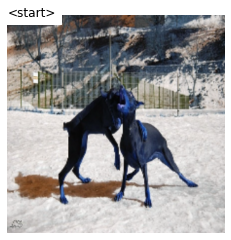

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


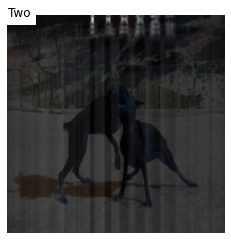

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


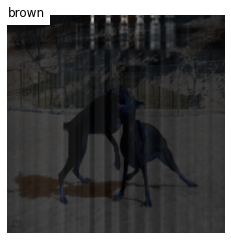

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


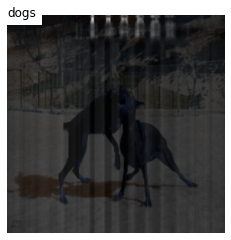

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


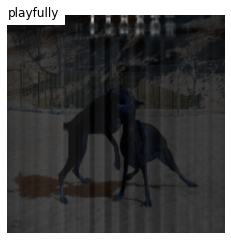

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


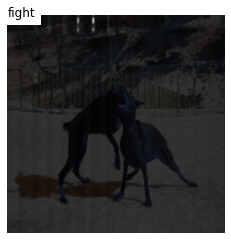

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


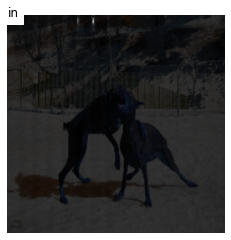

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


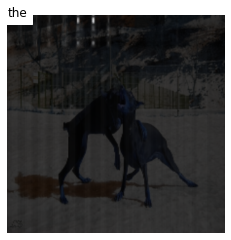

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


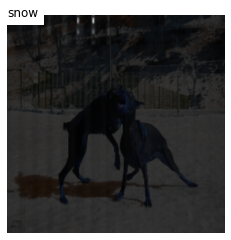

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


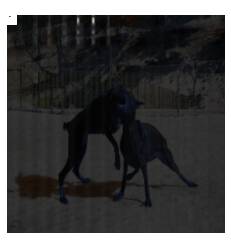

torch.Size([3, 224, 224])
(224, 224, 3)
(16, 82, 196) ALPHAS
(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


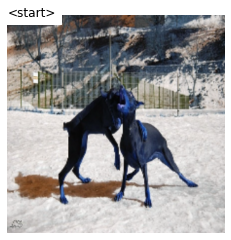

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


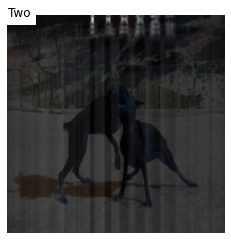

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


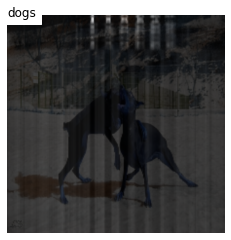

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


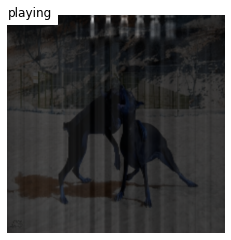

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


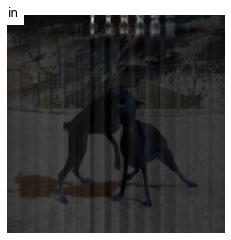

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


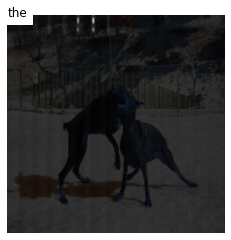

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


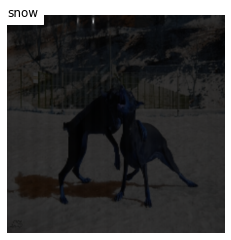

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


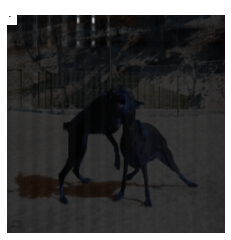

torch.Size([3, 224, 224])
(224, 224, 3)
(16, 82, 196) ALPHAS
(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


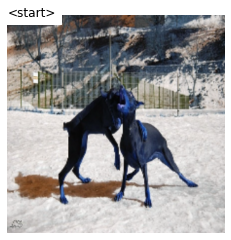

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


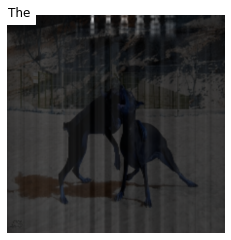

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


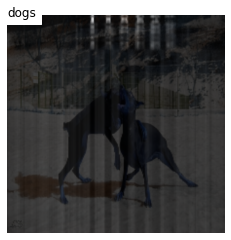

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


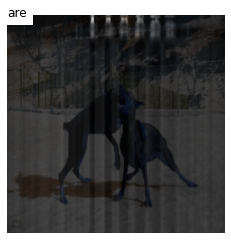

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


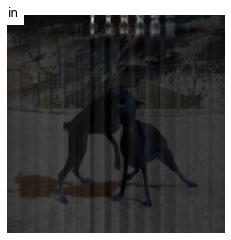

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


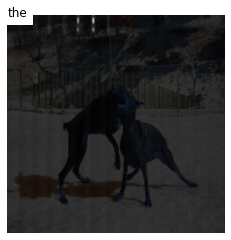

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


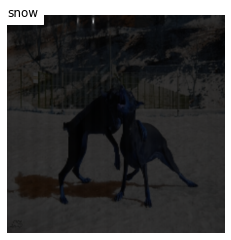

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


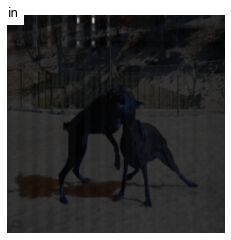

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


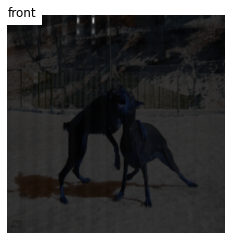

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


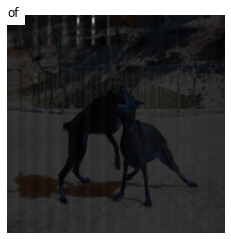

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


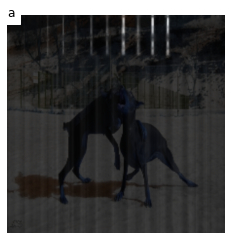

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


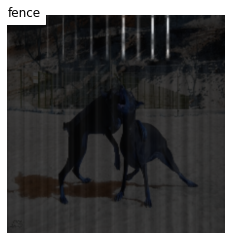

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


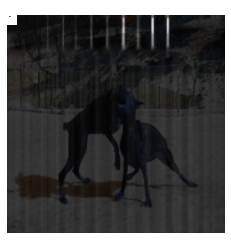

torch.Size([3, 224, 224])
(224, 224, 3)
(16, 82, 196) ALPHAS
(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


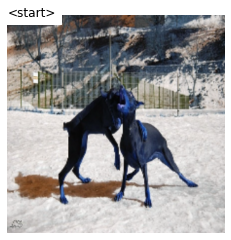

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


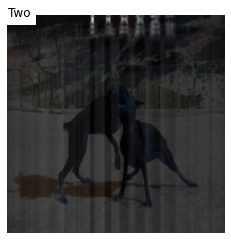

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


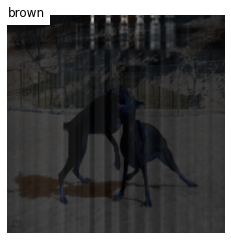

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


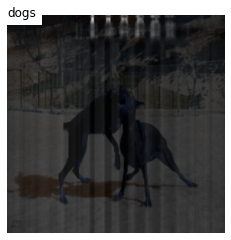

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


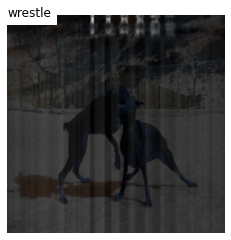

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


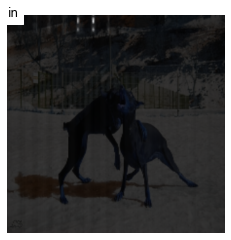

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


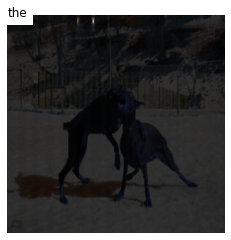

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


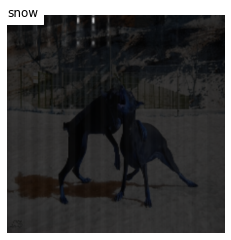

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


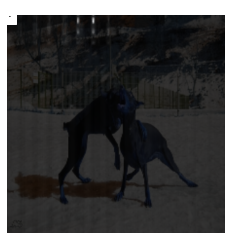

torch.Size([3, 224, 224])
(224, 224, 3)
(16, 82, 196) ALPHAS
(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


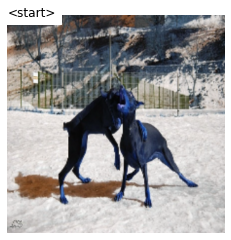

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


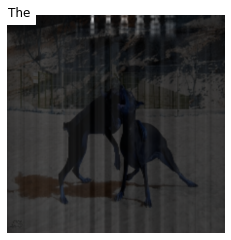

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


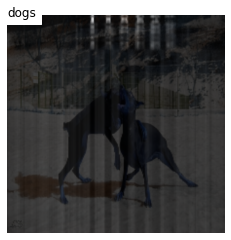

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


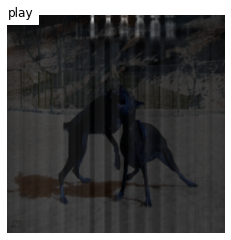

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


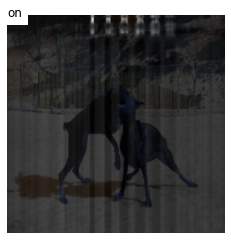

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


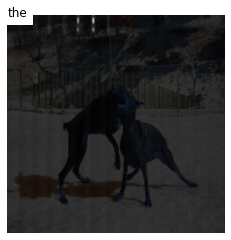

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


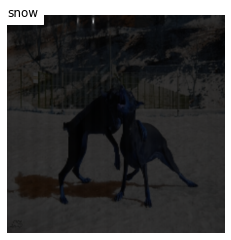

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


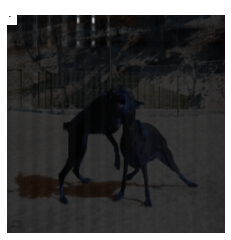

torch.Size([3, 224, 224])
(224, 224, 3)
(16, 82, 196) ALPHAS
(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


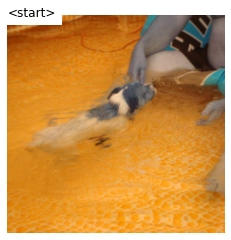

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


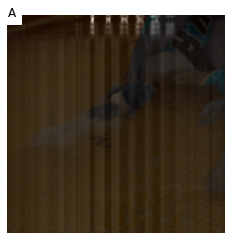

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


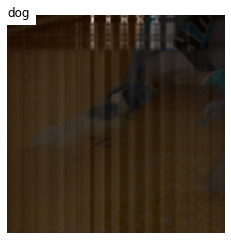

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


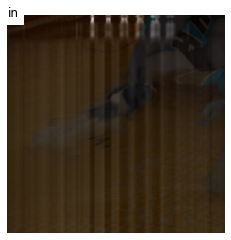

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


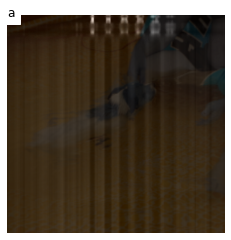

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


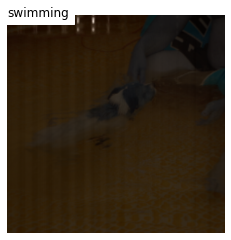

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


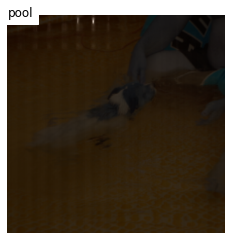

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


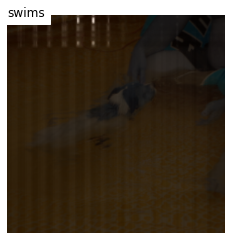

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


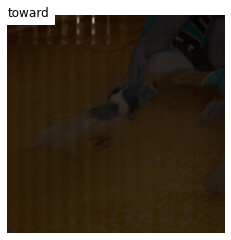

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


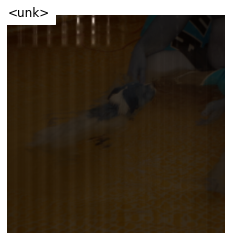

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


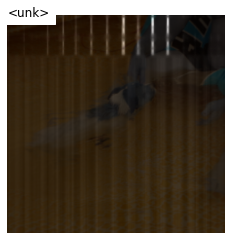

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


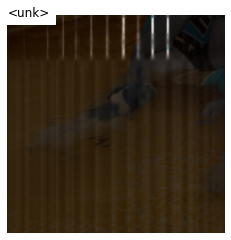

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


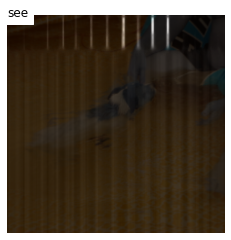

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


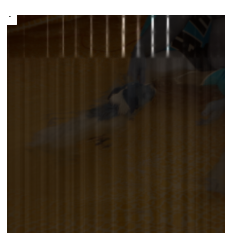

torch.Size([3, 224, 224])
(224, 224, 3)
(16, 82, 196) ALPHAS
(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


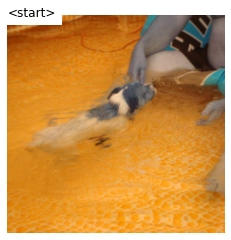

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


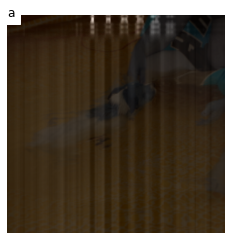

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


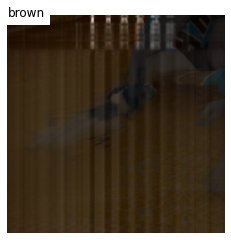

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


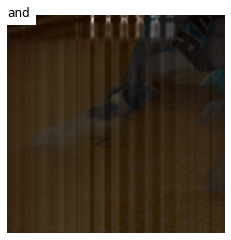

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


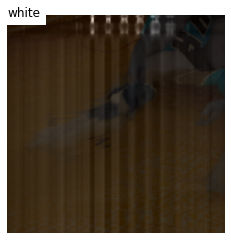

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


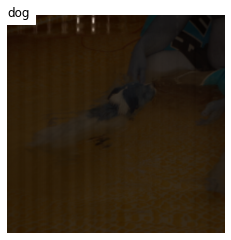

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


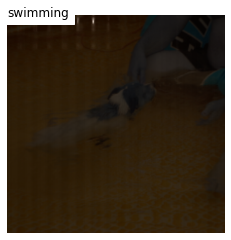

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


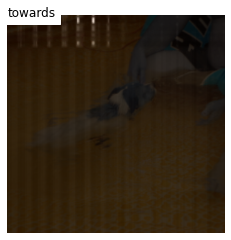

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


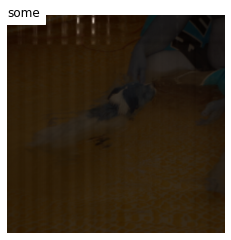

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


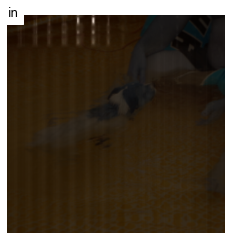

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


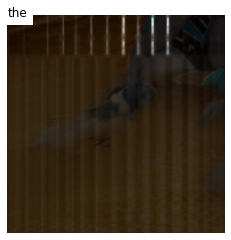

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


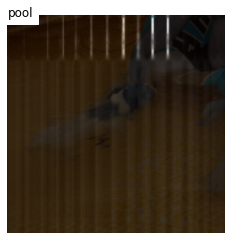

torch.Size([3, 224, 224])
(224, 224, 3)
(16, 82, 196) ALPHAS
(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


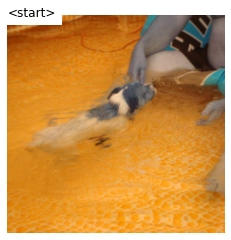

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


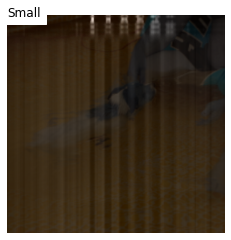

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


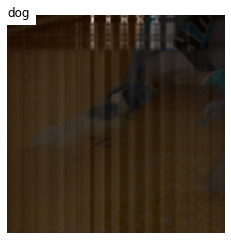

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


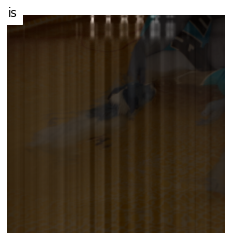

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


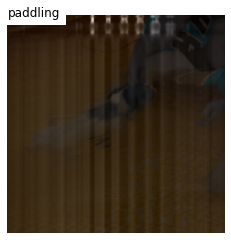

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


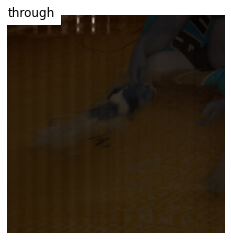

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


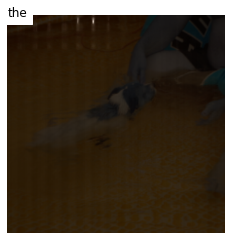

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


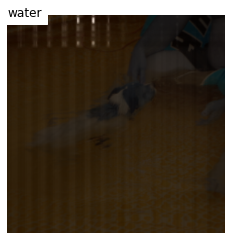

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


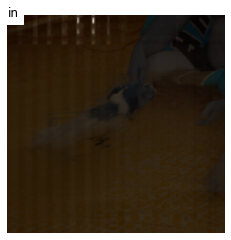

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


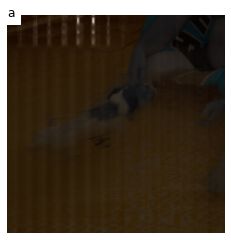

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


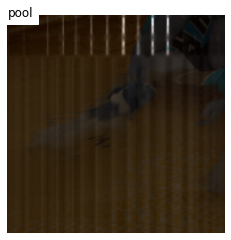

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


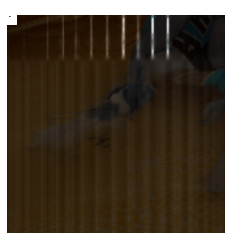

torch.Size([3, 224, 224])
(224, 224, 3)
(16, 82, 196) ALPHAS
(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


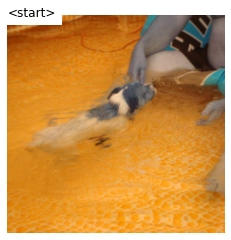

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


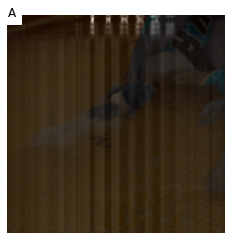

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


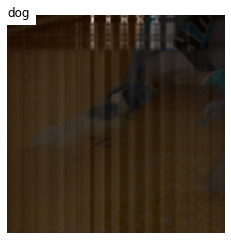

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


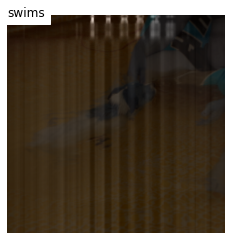

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


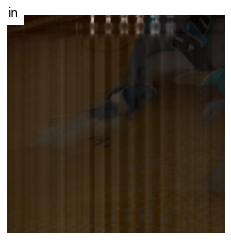

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


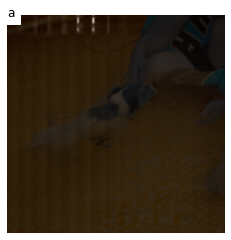

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


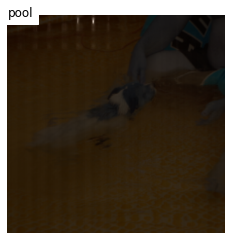

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


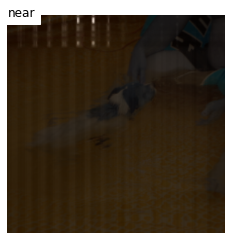

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


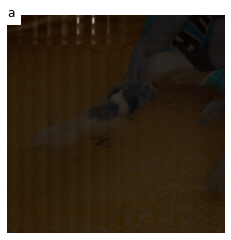

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


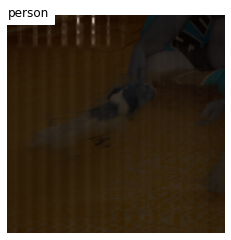

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


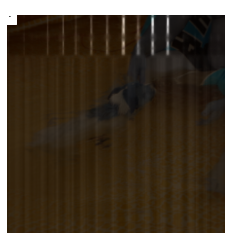

torch.Size([3, 224, 224])
(224, 224, 3)
(16, 82, 196) ALPHAS
(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


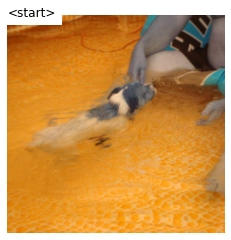

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


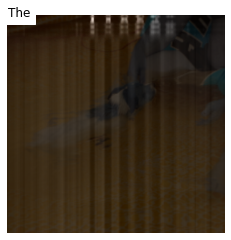

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


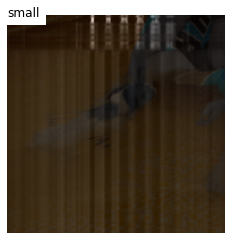

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


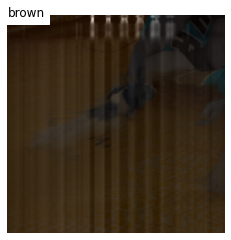

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


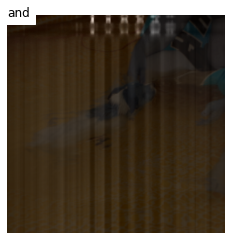

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


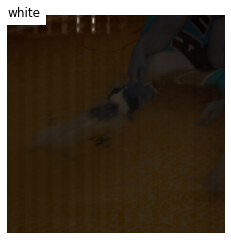

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


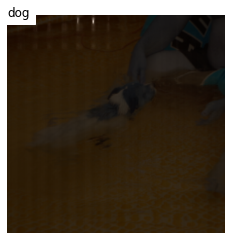

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


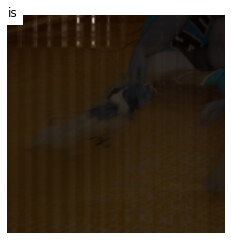

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


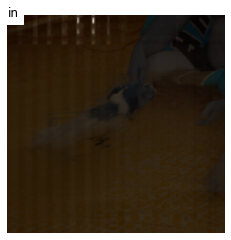

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


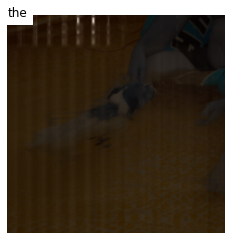

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


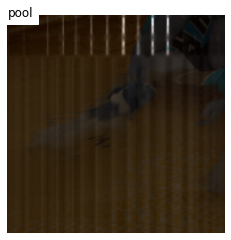

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


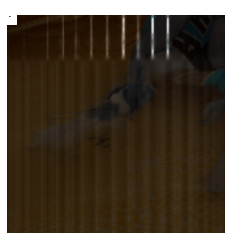

torch.Size([3, 224, 224])
(224, 224, 3)
(16, 82, 196) ALPHAS
(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


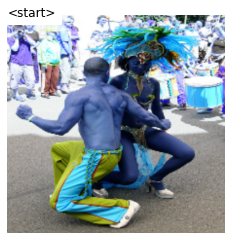

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


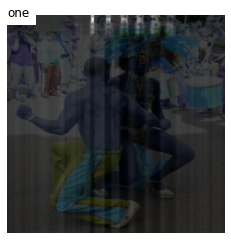

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


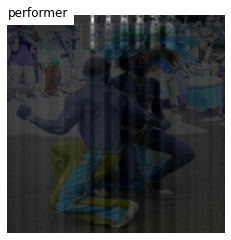

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


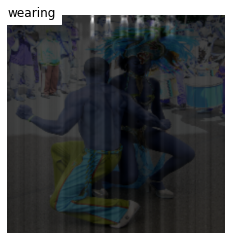

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


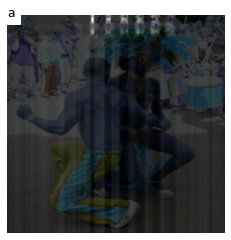

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


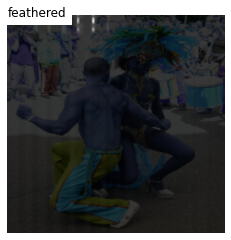

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


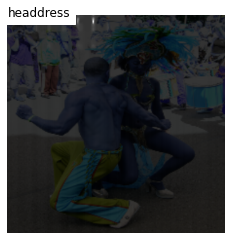

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


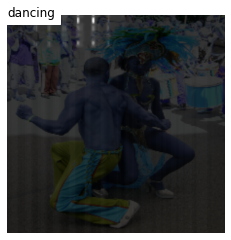

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


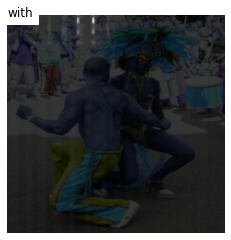

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


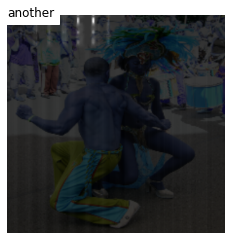

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


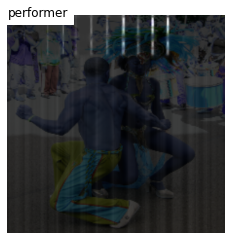

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


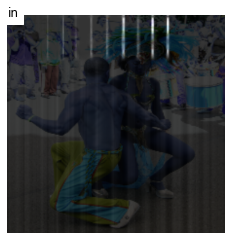

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


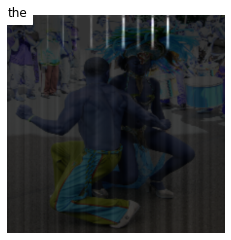

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


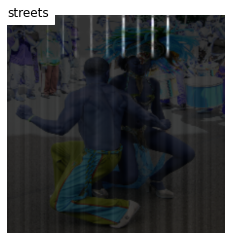

torch.Size([3, 224, 224])
(224, 224, 3)
(16, 82, 196) ALPHAS
(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


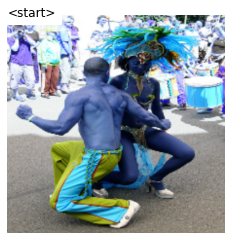

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


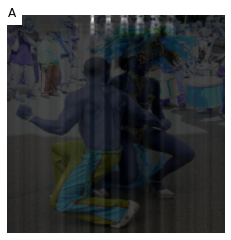

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


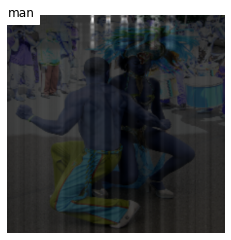

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


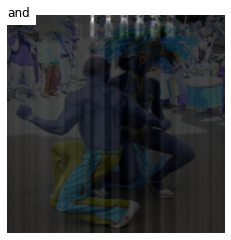

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


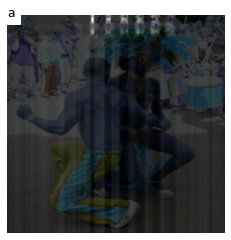

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


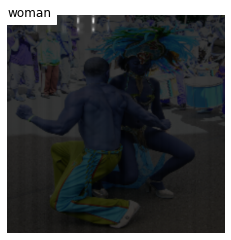

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


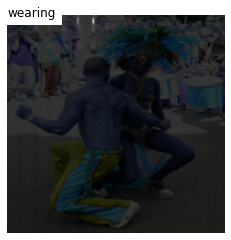

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


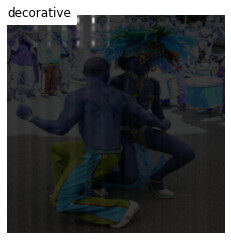

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


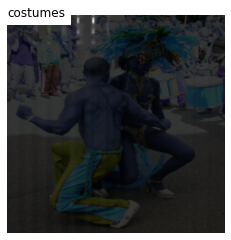

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


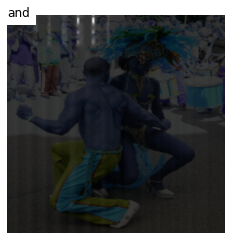

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


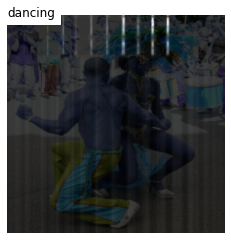

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


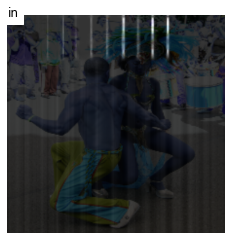

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


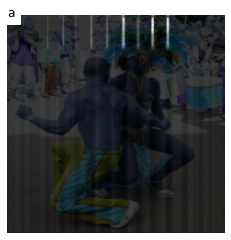

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


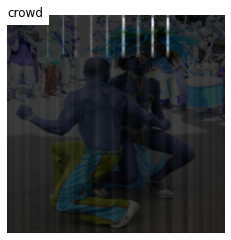

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


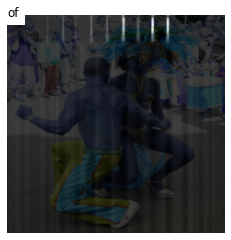

(350, 350, 3) IMAGE SHOWN
(82, 196) CALPHA
(350, 350) ALPHA


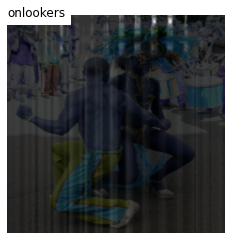

(350, 350, 3) IMAGE SHOWN


IndexError: ignored

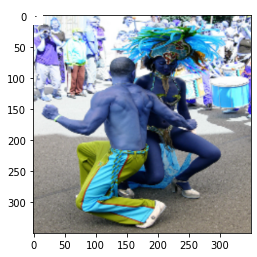

In [ ]:
test_loss, test_b1, b2, b3, b4, test_me = plot_att(encoder, decoder, test_dataloader)
print(test_b1, b2, b3, b4, test_m3)

In [ ]:
test_loss, test_b1,test_b2,test_b3,test_b4,test_me = evaluate(encoder, decoder, test_dataloader)

[['<start>', 'Two', 'brown', 'dogs', 'fight', 'in', 'the', 'snow', '.', '<end>'], ['<start>', 'Two', 'brown', 'dogs', 'fight', 'fight', 'in', 'the', 'snow', '.', '<end>'], ['<start>', 'The', 'dogs', 'are', 'in', 'the', 'snow', 'in', 'front', 'of', 'a', 'fence', '.', '<end>'], ['<start>', 'Two', 'dogs', 'playing', 'in', 'the', 'snow', '.', '<end>'], ['<start>', 'The', 'dogs', 'play', 'on', 'the', 'snow', '.', '<end>'], ['<start>', 'A', 'dog', 'climbs', 'in', 'a', 'pool', 'near', 'a', 'person', '.', '<end>'], ['<start>', 'A', 'dog', 'in', 'a', 'striped', 'pool', '<end>', 'toward', '<unk>', '<unk>', '<unk>', '<unk>', '.', '<end>'], ['<start>', 'A', 'dog', 'is', 'jumping', 'through', 'the', 'water', 'in', 'a', 'green', '.', '<end>'], ['<start>', 'a', 'brown', 'and', 'white', 'dog', 'swimming', 'towards', 'some', 'in', 'the', 'air', '<end>'], ['<start>', 'The', 'small', 'brown', 'and', 'white', 'dog', 'is', 'in', 'the', 'air', '.', '<end>'], ['<start>', 'one', 'boy', 'wearing', 'a', 'jean',

/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:516: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


RuntimeError: ignored

In [ ]:
import dill
with open('best_model_encoder_4a.pkl', 'wb') as f:
    dill.dump(encoder, f)
with open('best_model_decoder_4a.pkl', 'wb') as f2:
    dill.dump(decoder, f2)

In [ ]:
    torch.cuda.empty_cache()